### Auditory inspection 

We will use `IPython.display.Audio` to play the audio files so we can inspect aurally. 

In [1]:
import IPython.display as ipd

ipd.Audio('Audio data (6 Classes)\Chainsaw_Sounds\Chainsaw_1.wav',rate=44100)

### Visual inspection

We will load a sample from each class and visually inspect the data for any patterns. We will use librosa to load the audio file into an array then librosa.display and matplotlib to display the waveform. 

In [2]:
# Load imports

import IPython.display as ipd
import librosa
import librosa.display
import matplotlib.pyplot as plt
import pandas as pd
import audio_metadata
import os

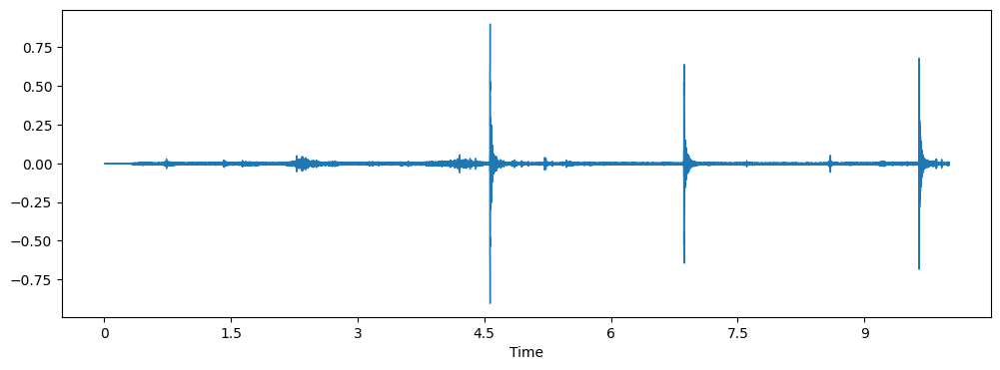

In [3]:
# Class: Axecutting Sounds

filename = 'Audio data (6 Classes)\Axecutting_Sounds\Axecutting_1.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveshow(data,sr=sample_rate)
ipd.Audio(filename)

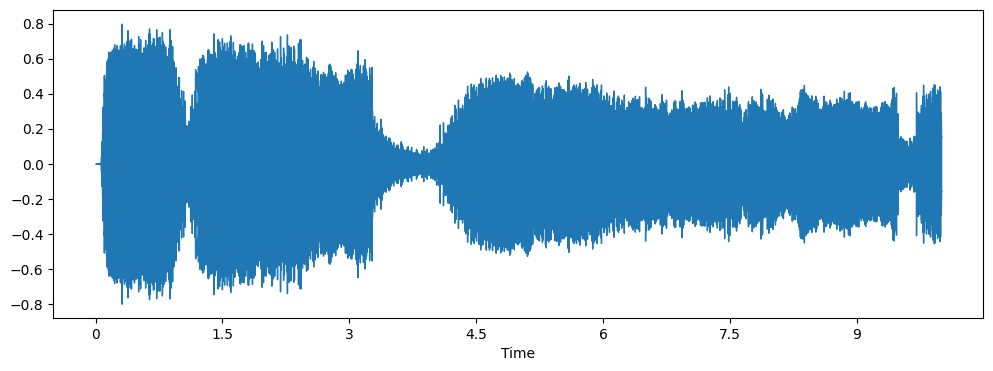

In [4]:
# Class: Chainsaw Sounds

filename = 'Audio data (6 Classes)\Chainsaw_Sounds\Chainsaw_1.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveshow(data,sr=sample_rate)
ipd.Audio(filename)

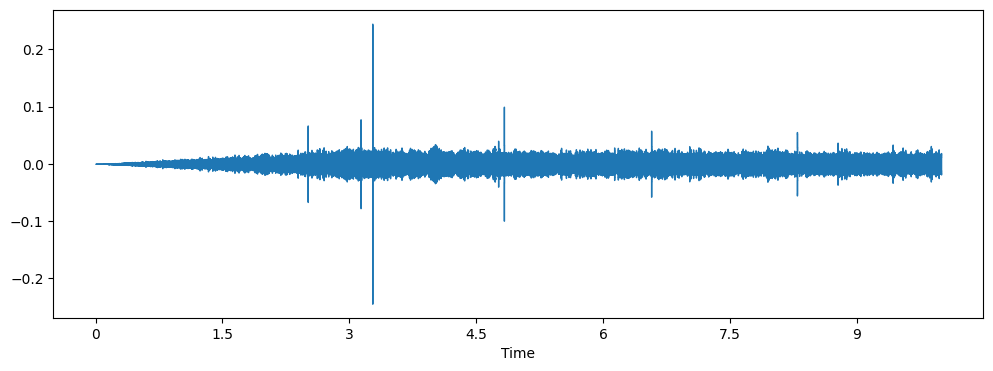

In [5]:
# Class: Forest Sounds

filename = 'Audio data (6 Classes)\Forest_Sounds\Forest_1.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveshow(data,sr=sample_rate)
ipd.Audio(filename)

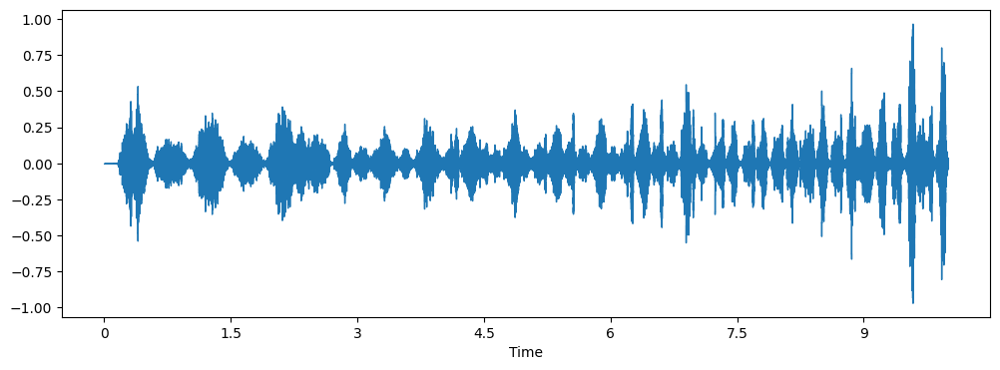

In [6]:
# Class: Handsaw Sounds

filename = 'Audio data (6 Classes)\Handsaw_Sounds\Handsaw_1.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveshow(data,sr=sample_rate)
ipd.Audio(filename)

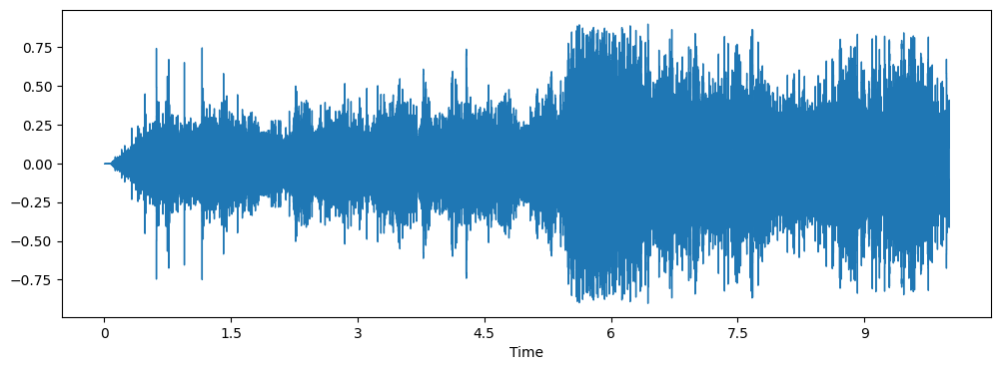

In [7]:
# Class: Rain & Thunder Related Sounds

filename = 'Audio data (6 Classes)\Rain&Thunder_Sounds\\Rain&Thunder_1.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveshow(data,sr=sample_rate)
ipd.Audio(filename)

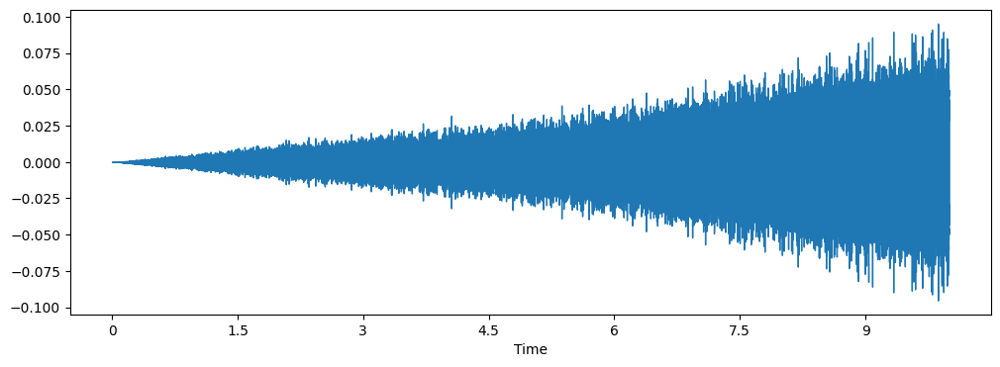

In [8]:
# Class: Wind Sounds

filename = 'Audio data (6 Classes)\Wind_Sounds\\Wind_1.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveshow(data,sr=sample_rate)
ipd.Audio(filename)

## Creating Meta Data .csv File

In [9]:
class_ids = {
    'Axecutting_Sounds' : 1,
    'Chainsaw_Sounds' : 2,
    'Forest_Sounds' : 3,
    'Handsaw_Sounds' : 4,
    'Rain&Thunder_Sounds' : 5,
    'Wind_Sounds' : 6
}

filenames = []
duration = []
filesize = []
bit_depth = []
bitrate = []
channels = []
sample_rate = []
class_name = []
class_id = []

for folder in os.listdir('Audio data (6 Classes)'):
    count = 0
    for filename in os.listdir('Audio data (6 Classes)/'+folder):
        metadata = audio_metadata.load('Audio data (6 Classes)/'+folder+'/'+filename)
        filenames.append(filename)
        duration.append(metadata.streaminfo.duration)
        filesize.append(metadata.filesize)
        bit_depth.append(metadata.streaminfo.bit_depth)
        bitrate.append(metadata.streaminfo.bitrate)
        channels.append(metadata.streaminfo.channels)
        sample_rate.append(metadata.streaminfo.sample_rate)
        class_name.append(folder)
        class_id.append(class_ids[folder])
        count += 1

dataframe = pd.DataFrame({
    'File Name' : filenames,
    'Duration' : duration,
    'File Size' : filesize,
    'Bit Depth' : bit_depth,
    'Bit Rate' : bitrate,
    'Channels' : channels,
    'Sample Rate' : sample_rate,
    'Class Name' : class_name,
    'Class ID' : class_id
})

In [10]:
dataframe.to_csv('AudioMetadata6Classes.csv')

### Class distributions

In [11]:
print(getattr(dataframe,'Class Name').value_counts())

Axecutting_Sounds      1200
Chainsaw_Sounds        1200
Forest_Sounds          1200
Handsaw_Sounds         1200
Rain&Thunder_Sounds    1200
Wind_Sounds            1200
Name: Class Name, dtype: int64


### Audio channels 

Most of the samples have two audio channels (meaning stereo) with a few with just the one channel (mono). 

The easiest option here to make them uniform will be to merge the two channels in the stero samples into one by averaging the values of the two channels. 

In [12]:
# num of channels 

print(getattr(dataframe,'Channels').value_counts())

2    6789
1     411
Name: Channels, dtype: int64


### Sample rate 

There is a wide range of Sample rates that have been used across all the samples which is a concern (ranging from 96k to 8k).

This likley means that we will have to apply a sample-rate conversion technique (either up-conversion or down-conversion) so we can see an agnostic representation of their waveform which will allow us to do a fair comparison. 

In [13]:
# sample rates 

print(getattr(dataframe,'Sample Rate').value_counts())

44100    5216
48000    1739
8000      200
16000      45
Name: Sample Rate, dtype: int64


### Bit-depth 

There is also a wide range of bit-depths. It's likely that we may need to normalise them by taking the maximum and minimum amplitude values for a given bit-depth. 

In [14]:
# bit depth

print(getattr(dataframe,'Bit Depth').value_counts())

16    7190
32      10
Name: Bit Depth, dtype: int64
